In [1]:
import pandas as pd
import numpy as np

In [2]:
import pickle
import pgmpy

In [3]:
with open("../models/bayesian_18countries_learnt_bn_treesearch.pickle", "rb") as handle:
    model = pickle.load(handle)

In [4]:
train_df = pd.read_csv("../data/processed/train_18_countries.csv")
print(train_df.shape)
train_df.head()

(495, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,6,2
1,0,2,2,0.0,2,3,4,2,2,3.0,...,1,0,0,1,4,1,0,1,4,1
2,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,2,2,0.0,2,1,4,2,2,3.0,...,1,0,0,0,4,1,0,1,4,1


In [5]:
test_df = pd.read_csv("../data/processed/test_18_countries.csv")
print(test_df.shape)
test_df.head()

(165, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
1,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,6,3,0,1,6,2
2,0,2,2,2.0,2,3,0,2,1,3.0,...,0,0,0,0,1,0,0,1,1,1
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,0,2,2.0,2,3,0,1,1,3.0,...,0,0,0,0,0,0,0,0,1,0


In [6]:
test_df.filter(regex="[a-z]_singapore").columns

Index(['income_support_singapore', 'shn_requirement_singapore',
       'contact_tracing_singapore', 'deaths_per_mil_cat_singapore',
       'vaccine_policy_singapore', 'restriction_internal_movement_singapore',
       'testing_policy_singapore', 'internation_travel_control_singapore',
       'pi_campaign_singapore', 'school_closures_singapore',
       'cancel_public_events_singapore', 'debt_relief_singapore',
       'workplace_closures_singapore', 'restrict_public_gathering_singapore',
       'closure_public_transport_singapore', 'facial_covering_singapore',
       'cases_per_mil_cat_singapore'],
      dtype='object')

In [7]:
from pgmpy.inference import VariableElimination

ve = VariableElimination(model)

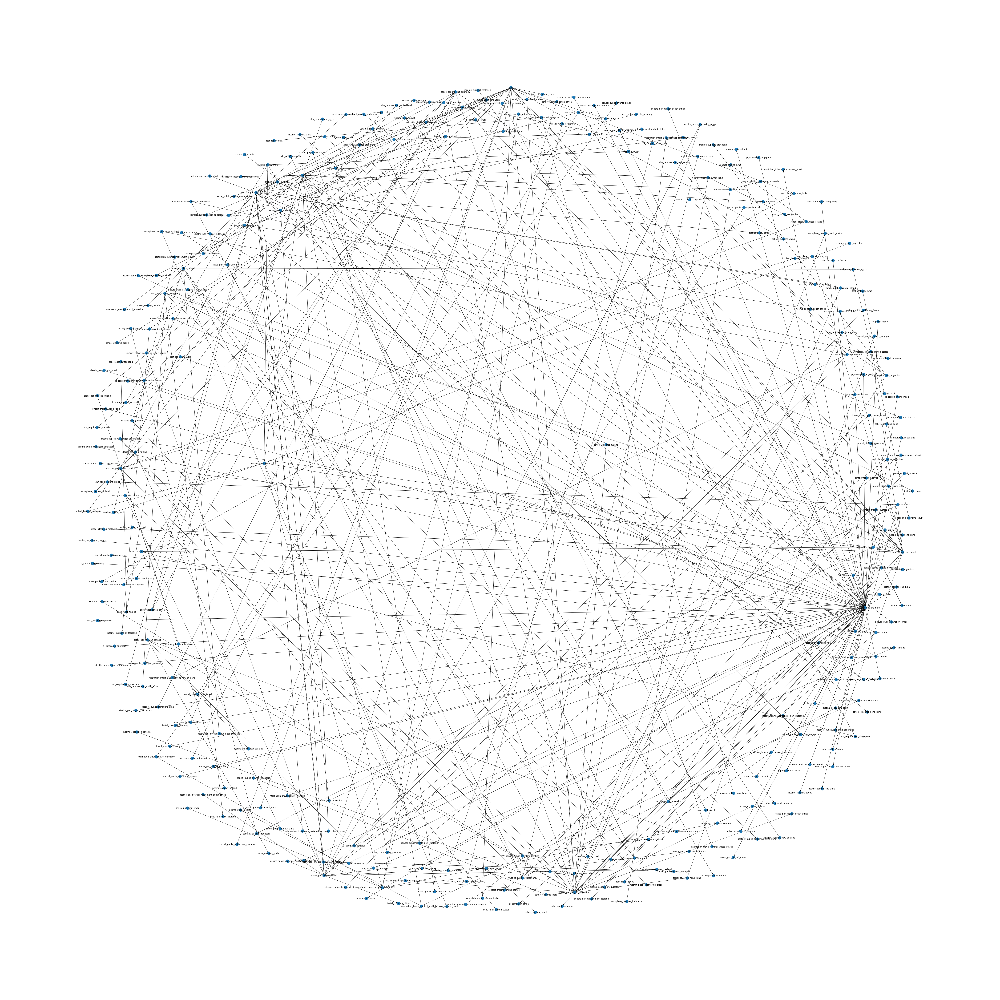

In [8]:
import networkx as nx
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(80, 80))
nx.draw(model, with_labels=True, ax=ax)
plt.tight_layout()

## Network Analysis

In [9]:
nodes_and_children = [(node, model.get_children(node)) for node in model.nodes]
node_to_children_map = {
    node: children
    for node, children in sorted(
        nodes_and_children, key=lambda el: len(el[1]), reverse=True
    )
}

In [15]:
# fig, ax = plt.subplots(1, 1, figsize=(60, 60))
# nx.draw(model.subgraph(["workplace_closures_germany"] + node_to_children_map["workplace_closures_germany"]), with_labels=True, ax=ax)
# plt.tight_layout()

for idx, (node, children) in enumerate(node_to_children_map.items()):
    if node == "date":
        continue

    print(f"Node - {node}")
    print(f"Number of children - {len(children)}")
    policy = node[: node.rindex("_")]
    print(
        f"Number of related policies in other countries - {[child for child in children if policy in child]}"
    )
    linked_countries = {
        child[child.rindex("_") + 1 :] for child in children if child != "date"
    }
    print(f"Number of linked countries - {len(linked_countries)} ({linked_countries})")
    print()

    if idx == 10:
        break

Node - workplace_closures_germany
Number of children - 68
Number of related policies in other countries - []
Number of linked countries - 18 ({'malaysia', 'australia', 'zealand', 'canada', 'egypt', 'india', 'finland', 'singapore', 'china', 'kong', 'africa', 'argentina', 'switzerland', 'brazil', 'germany', 'states', 'indonesia', 'israel'})

Node - cases_per_mil_cat_argentina
Number of children - 24
Number of related policies in other countries - ['cases_per_mil_cat_canada', 'cases_per_mil_cat_south_africa']
Number of linked countries - 12 ({'egypt', 'finland', 'india', 'kong', 'states', 'switzerland', 'china', 'germany', 'canada', 'brazil', 'indonesia', 'africa'})

Node - cases_per_mil_cat_united_states
Number of children - 23
Number of related policies in other countries - []
Number of linked countries - 11 ({'malaysia', 'australia', 'canada', 'singapore', 'kong', 'africa', 'switzerland', 'brazil', 'germany', 'states', 'israel'})

Node - cases_per_mil_cat_brazil
Number of children - 17

In [11]:
print(f"Total nodes - {len(model.nodes)}")
print(
    f"Leaf nodes - {len([node for node in model.nodes if len(model.get_children(node)) == 0])}"
)

Total nodes - 307
Leaf nodes - 239


In [12]:
model.get_roots()

['cases_per_mil_cat_brazil']

In [13]:
[edge for edge in model.edges if "singapore" in edge[0]]

[('school_closures_singapore', 'cancel_public_events_germany'),
 ('cases_per_mil_cat_singapore', 'debt_relief_new_zealand'),
 ('cases_per_mil_cat_singapore', 'testing_policy_finland'),
 ('cases_per_mil_cat_singapore', 'shn_requirement_south_africa'),
 ('cases_per_mil_cat_singapore', 'testing_policy_hong_kong'),
 ('cases_per_mil_cat_singapore', 'restrict_public_gathering_hong_kong'),
 ('vaccine_policy_singapore', 'debt_relief_australia'),
 ('shn_requirement_singapore', 'restriction_internal_movement_singapore')]